In [1]:
!git clone https://github.com/fizyr/keras-retinanet.git


Cloning into 'keras-retinanet'...
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 6205 (delta 1), reused 3 (delta 1), pack-reused 6196
Receiving objects: 100% (6205/6205), 13.48 MiB | 33.17 MiB/s, done.
Resolving deltas: 100% (4196/4196), done.


In [30]:
import tensorflow as tf
import keras

In [34]:
print("tf", tf.__version__)
print("keras", keras.__version__)

tf 2.3.0
keras 2.4.3


In [2]:
%cd keras-retinanet/
!pip install .
!python setup.py build_ext --inplace

/content/keras-retinanet
Processing /content/keras-retinanet
  Created wheel for keras-retinanet: filename=keras_retinanet-1.0.0-cp36-cp36m-linux_x86_64.whl size=168068 sha256=a147d3b8001ee1bbca1562db43697ef71f4db29efd912ccba9c01f0814e35ea7
  Stored in directory: /root/.cache/pip/wheels/b2/9f/57/cb0305f6f5a41fc3c11ad67b8cedfbe9127775b563337827ba
  Created wheel for keras-resnet: filename=keras_resnet-0.2.0-py2.py3-none-any.whl size=20487 sha256=a0faf1bdcb54330aa69761fab82e7f9e4e7b23f43e3e260bf1fa7db34f41fa7f
  Stored in directory: /root/.cache/pip/wheels/5f/09/a5/497a30fd9ad9964e98a1254d1e164bcd1b8a5eda36197ecb3c
Successfully built keras-retinanet keras-resnet
running build_ext
cythoning keras_retinanet/utils/compute_overlap.pyx to keras_retinanet/utils/compute_overlap.c
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/keras-retinanet/k

In [8]:
import os
os.chdir('/content/keras-retinanet/')
print(os.getcwd())

/content/keras-retinanet


In [9]:
import numpy as np
import shutil
import pandas as pd
import os, sys, random
import xml.etree.ElementTree as ET
import pandas as pd
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
from PIL import Image
import requests
import urllib

In [10]:
from keras_retinanet.utils.visualization import draw_box, draw_caption , label_color
from keras_retinanet.utils.image import preprocess_image, resize_image

In [73]:
name = ['file_path', 'xmin', 'ymin', 'xmax', 'ymax', 'class']

In [74]:
data = pd.read_csv('./annotations.csv', names=name) 
data.head()

data.shape
batchsize = 8
step = data.shape[0] // batchsize


print(data.shape, step)


(120, 6) 15


In [76]:
data.head()

,file_path,xmin,ymin,xmax,ymax,class
0,images/hand_078.png,56,28,190,223,hand
1,images/hand_142.png,45,49,138,215,hand
2,images/hand_130.png,28,52,131,218,hand
3,images/hand_118.png,51,24,165,223,hand
4,images/hand_089.png,47,39,182,224,hand


images/hand_142.png hand [45, 49, 138, 215]


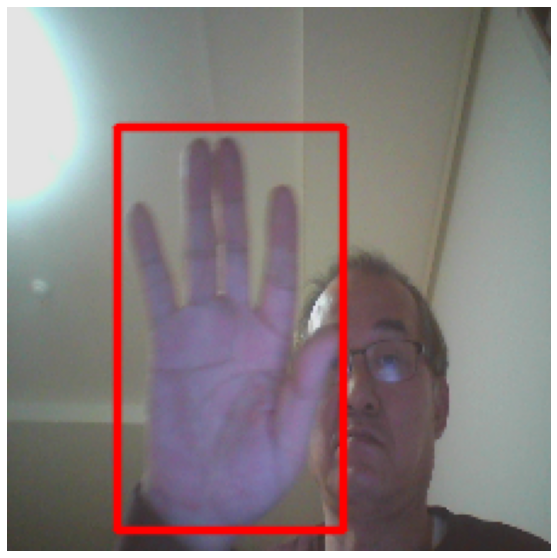

In [78]:
def show_image_with_boxes(df):
  # pick a random image
  filepath = df.sample()['file_path'].values[0]

  # get all rows for this image
  df2 = df[df['file_path'] == filepath]
  im = np.array(Image.open('./'+filepath))

  # if there's a PNG it will have alpha channel
  im = im[:,:,:3]

  for idx, row in df2.iterrows():
    image_path = row['file_path']
    box = [
      row['xmin'],
      row['ymin'],
      row['xmax'],
      row['ymax'],
    ]
    print(image_path, row['class'],box)
    draw_box(im, box, color=(255, 0, 0))

  plt.axis('off')
  plt.imshow(im)
  plt.show()                  
                  
show_image_with_boxes(data)

In [23]:
PRETRAINED_MODEL = './snapshots/_pretrained_model.h5'
URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

('./snapshots/_pretrained_model.h5',
 <http.client.HTTPMessage at 0x7fe7325d8128>)

In [42]:
latest_path='./snapshots/_pretrained_model.h5'
batchsize=8
step = data.shape[0] // batchsize

In [43]:
!keras_retinanet/bin/train.py --freeze-backbone --random-transform --weights {latest_path} --backbone='resnet50' --batch-size {batchsize} --steps {step} --epochs 20 csv annotations.csv classes.csv


2020-11-16 12:31:39.864704: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Creating model, this may take a second...
2020-11-16 12:31:41.340744: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-11-16 12:31:41.381307: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-11-16 12:31:41.381931: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.73GiB deviceMemoryBandwidth: 298.08GiB/s
2020-11-16 12:31:41.381970: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-11-16 12:31:41.383671: I t

In [54]:
from glob import glob
model_paths = glob('./snapshots/resnet50_csv_*.h5')
latest_path = "./snapshots/resnet50_csv_20.h5"
print("path:", latest_path)



path: ./snapshots/resnet50_csv_20.h5


In [55]:
from keras_retinanet import models

model = models.load_model(latest_path, backbone_name='resnet50')
model = models.convert_model(model)


In [57]:
label_map = {}
for line in open('./classes.csv'):
  row = line.rstrip().split(',')
  label_map[int(row[1])] = row[0]

print(label_map)

{0: 'hand'}


In [93]:
def show_image_with_predictions(df, threshold=0.6):
  acc = 0
  num = 0
  # choose a random image
  for row in df.itertuples():
    filepath = row[1]
    # df2 = df[df['file_path'] == filepath]
    df2=df['file_path']
    im = np.array(Image.open(filepath))

    # if there's a PNG it will have alpha channel
    im = im[:,:,:3]

    # plot true boxes
    box = [
      row[2],
      row[3],
      row[4],
      row[5],
    ]
    label = {j:i for i, j in label_map.items()}[row[6]]

    ### plot predictions ###

    # get predictions
    imp = preprocess_image(im)
    imp, scale = resize_image(im)

    boxes, scores, labels = model.predict_on_batch(
      np.expand_dims(imp, axis=0)
    )

    # standardize box coordinates
    boxes /= scale
    max_score = threshold 
    max_label = -1
    # loop through each prediction for the input image
    for box1, score1, label1 in zip(boxes[0], scores[0], labels[0]):
      # scores are sorted so we can quit as soon
      # as we see a score below threshold
      if score1 > max_score:
        box_p = box1
        score_p = score1
        label_p = label1
        max_score = score1
        max_label = label1
          
    if max_label == label:
      acc += 1
    if num % 1 == 0:
      print(f"Actual : {filepath}")
      b_box = box_p.astype(np.int32)
      color = label_color(label_p)
      draw_box(im, box_p, color=color)
      print(f"Predicted : {label_map[label_p]}, Predicted Confidence : {str(int(score_p * 100)) + '%'}")
      class_name = label_map[label_p]
      caption = f"{class_name} {score_p:.4f}"
      draw_caption(im, b_box, caption)
      draw_box(im, box, color=(255, 0, 0))
      plt.axis('off')
      plt.imshow(im)
      plt.show()
    num += 1
  print(f"Accuracy on around 300 test images: {acc / num}")


In [95]:
plt.rcParams['figure.figsize'] = [10, 10]

In [83]:
test_df = pd.read_csv('annotations_test.csv', names=name)
test_df.shape

(31, 6)

In [84]:
test_df.head()

,file_path,xmin,ymin,xmax,ymax,class
0,images/hand_085.png,114,27,218,223,hand
1,images/hand_111.png,38,50,117,220,hand
2,images/hand_003.png,1,77,59,223,hand
3,images/hand_128.png,44,58,150,217,hand
4,images/hand_006.png,54,49,146,218,hand


In [81]:
os.getcwd()

'/content/keras-retinanet'

Actual : images/hand_085.png
Predicted : hand, Predicted Confidence : 97%


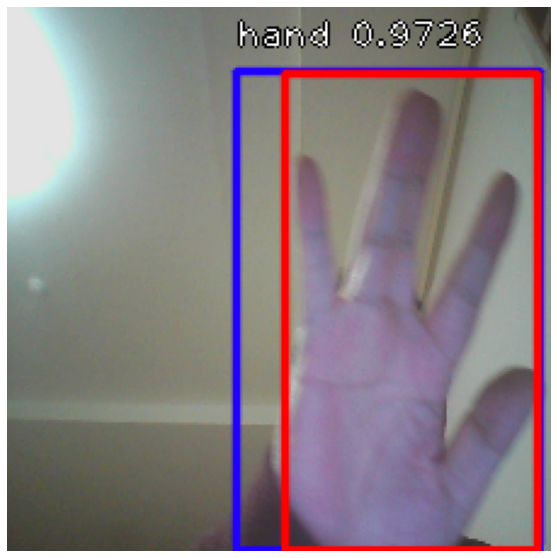

Actual : images/hand_111.png
Predicted : hand, Predicted Confidence : 75%


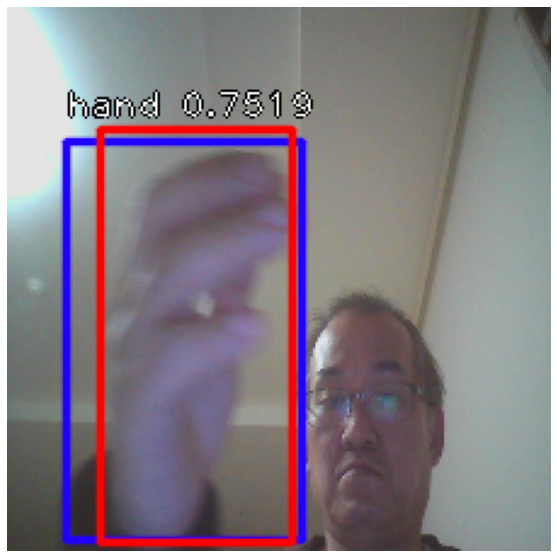

Actual : images/hand_003.png
Predicted : hand, Predicted Confidence : 54%


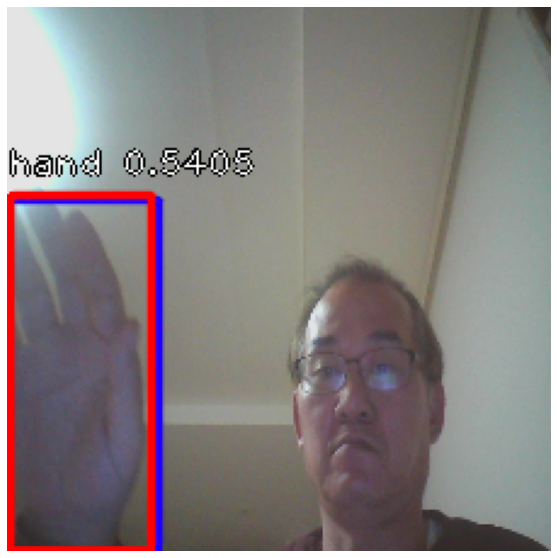

Actual : images/hand_128.png
Predicted : hand, Predicted Confidence : 89%


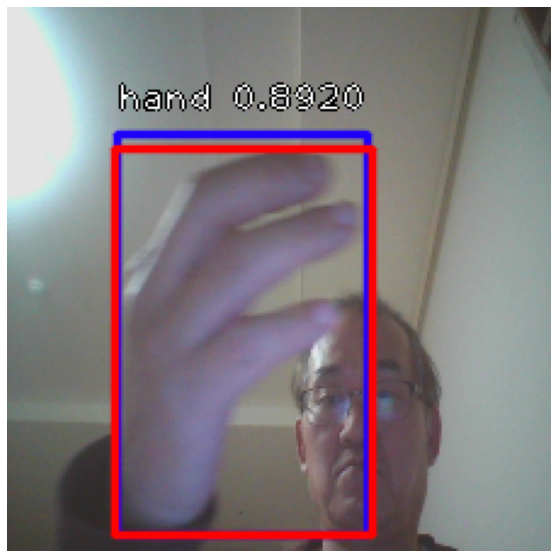

Actual : images/hand_006.png
Predicted : hand, Predicted Confidence : 88%


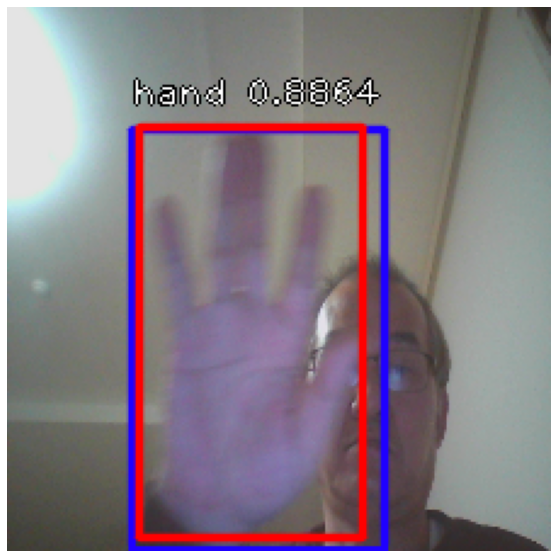

Actual : images/hand_012.png
Predicted : hand, Predicted Confidence : 95%


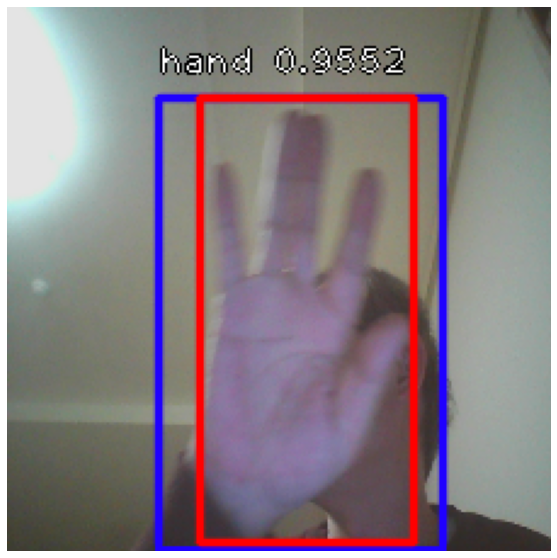

Actual : images/hand_137.png
Predicted : hand, Predicted Confidence : 97%


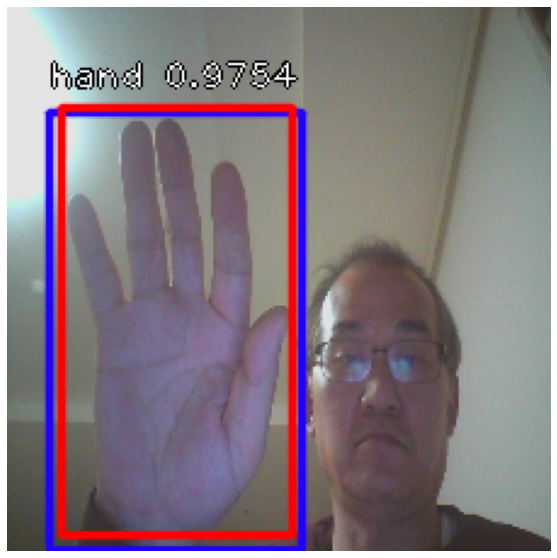

Actual : images/hand_105.png
Predicted : hand, Predicted Confidence : 97%


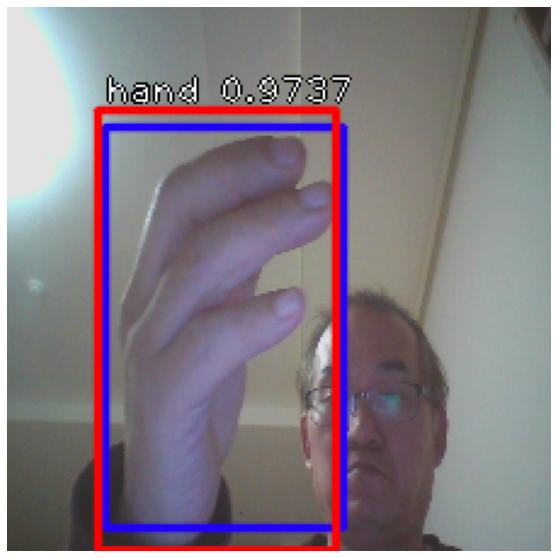

Actual : images/hand_023.png
Predicted : hand, Predicted Confidence : 99%


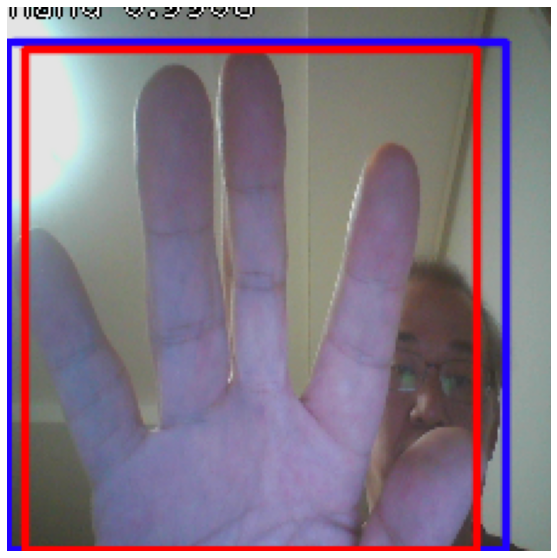

Actual : images/hand_025.png
Predicted : hand, Predicted Confidence : 99%


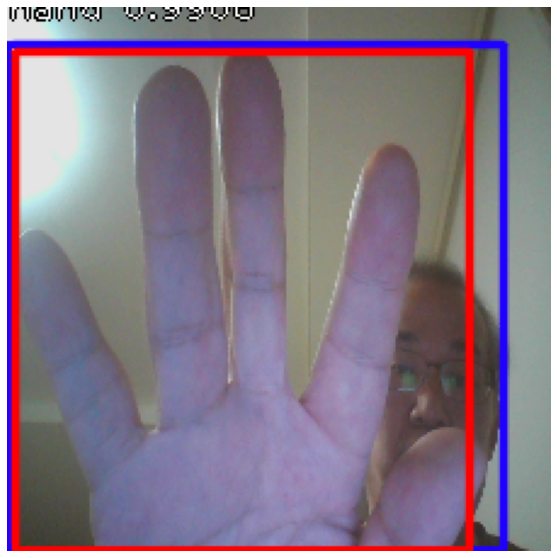

Actual : images/hand_029.png
Predicted : hand, Predicted Confidence : 98%


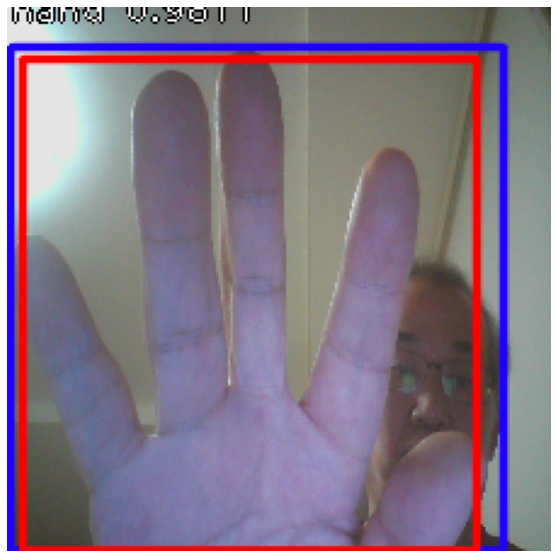

Actual : images/hand_065.png
Predicted : hand, Predicted Confidence : 98%


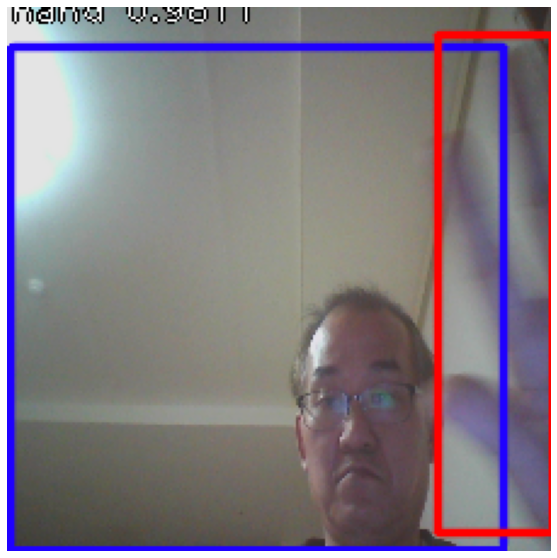

Actual : images/hand_071.png
Predicted : hand, Predicted Confidence : 94%


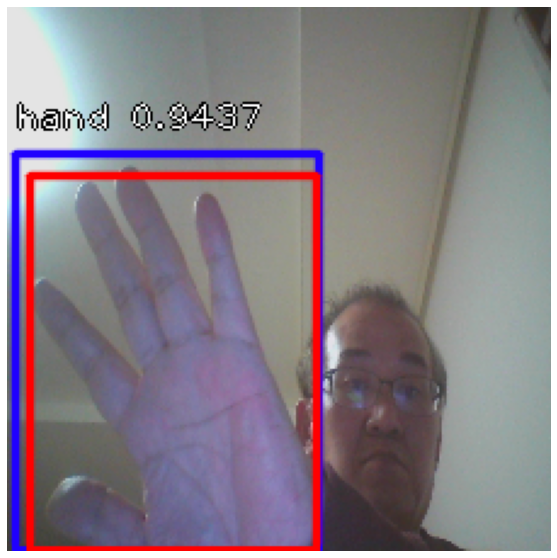

Actual : images/hand_097.png
Predicted : hand, Predicted Confidence : 81%


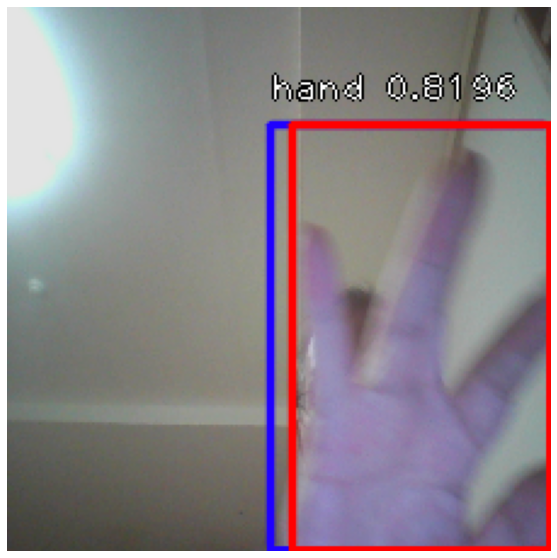

Actual : images/hand_129.png
Predicted : hand, Predicted Confidence : 90%


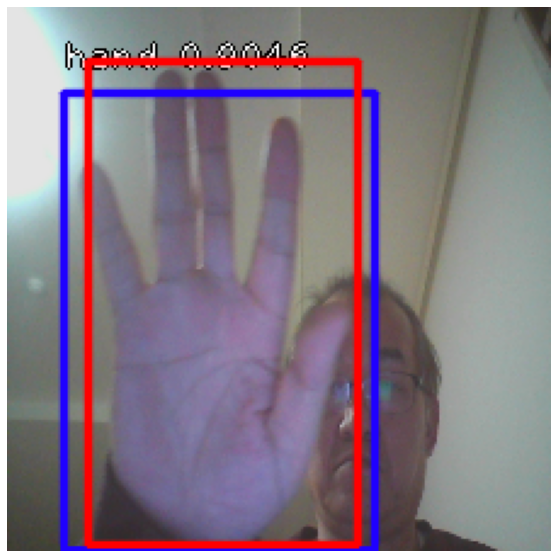

Actual : images/hand_005.png
Predicted : hand, Predicted Confidence : 97%


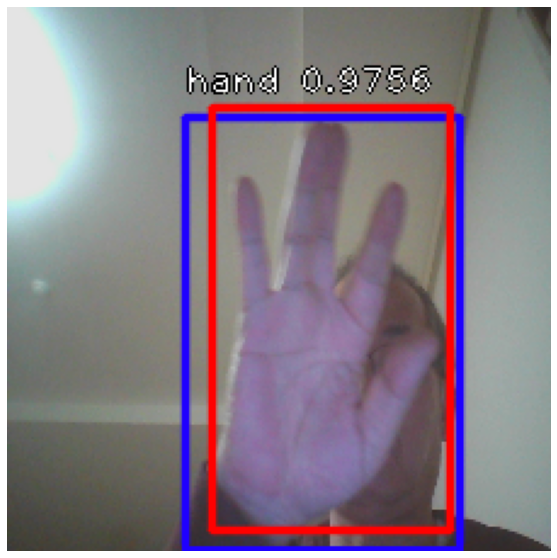

Actual : images/hand_042.png
Predicted : hand, Predicted Confidence : 98%


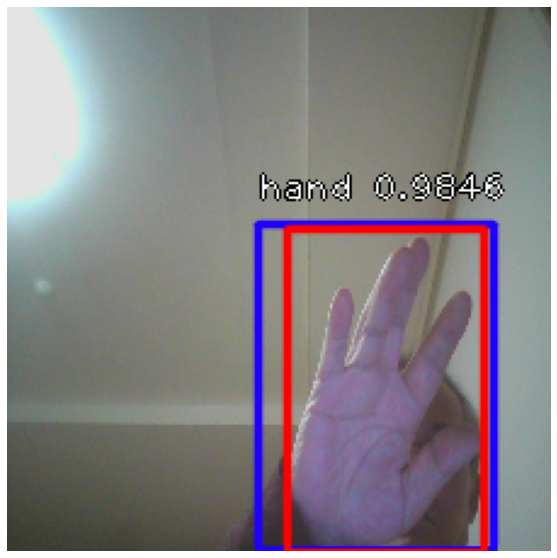

Actual : images/hand_053.png
Predicted : hand, Predicted Confidence : 97%


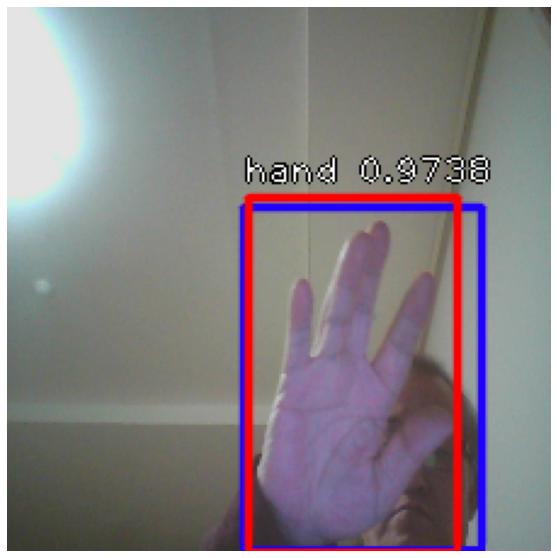

Actual : images/hand_125.png
Predicted : hand, Predicted Confidence : 86%


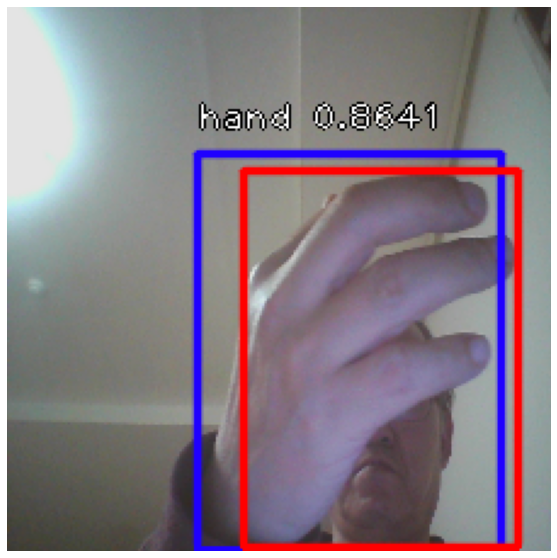

Actual : images/hand_048.png
Predicted : hand, Predicted Confidence : 97%


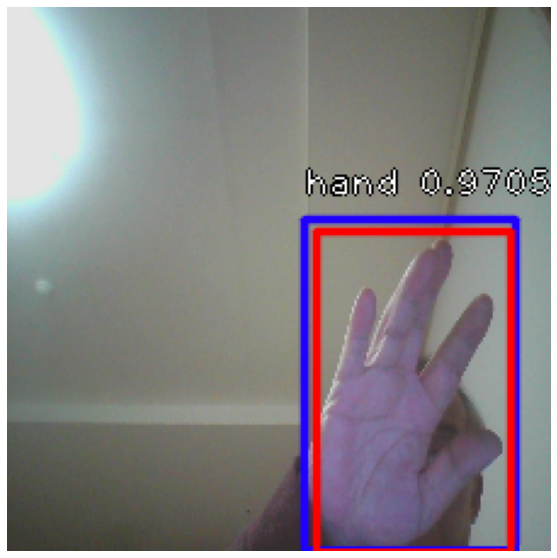

Actual : images/hand_035.png
Predicted : hand, Predicted Confidence : 97%


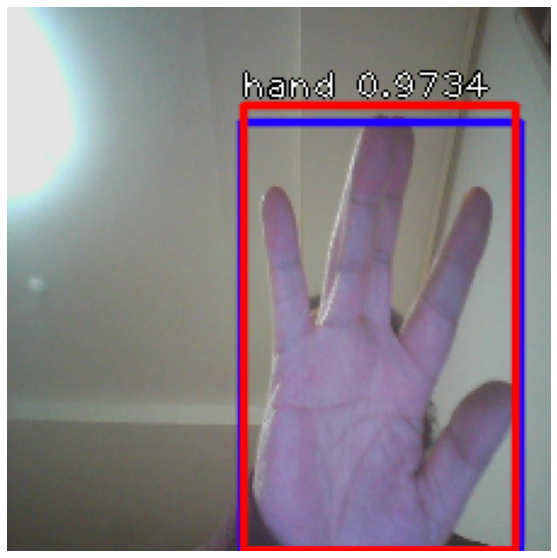

Actual : images/hand_096.png
Predicted : hand, Predicted Confidence : 80%


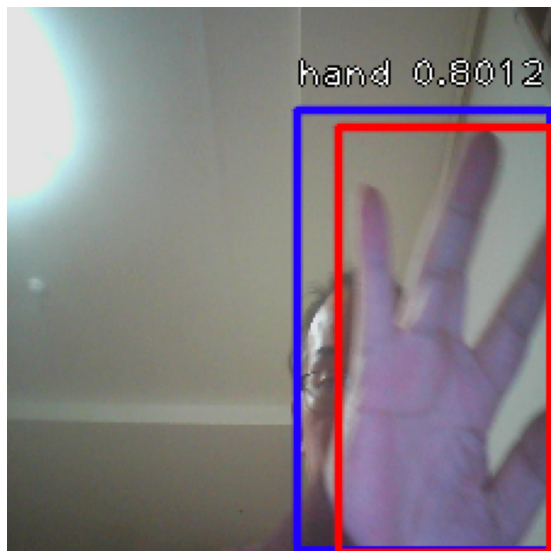

Actual : images/hand_041.png
Predicted : hand, Predicted Confidence : 98%


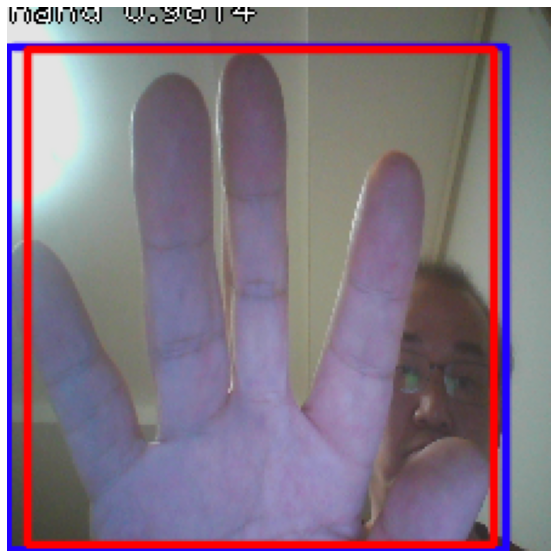

Actual : images/hand_024.png
Predicted : hand, Predicted Confidence : 83%


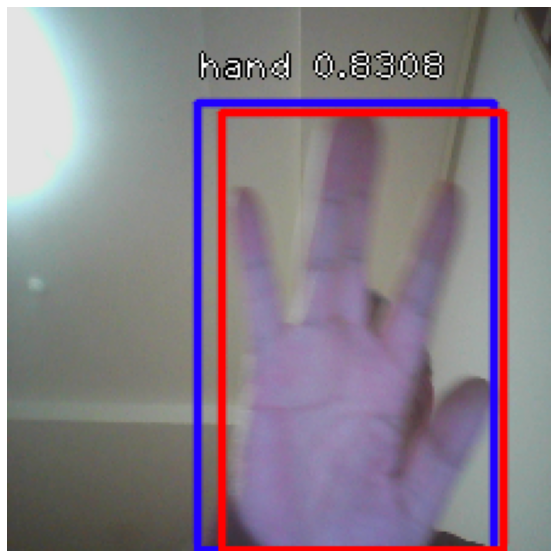

Actual : images/hand_081.png
Predicted : hand, Predicted Confidence : 54%


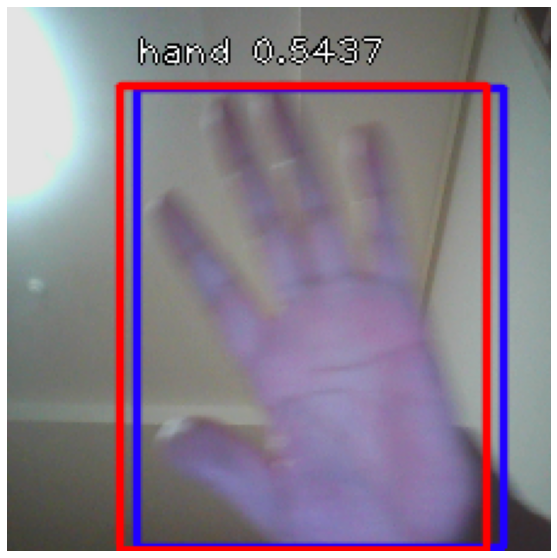

Actual : images/hand_109.png
Predicted : hand, Predicted Confidence : 82%


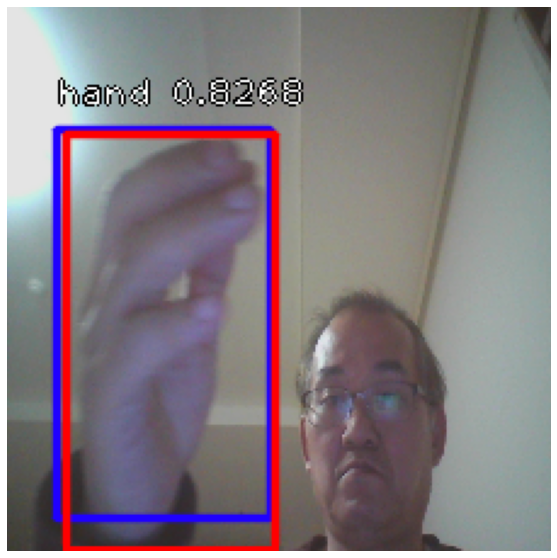

Actual : images/hand_127.png
Predicted : hand, Predicted Confidence : 90%


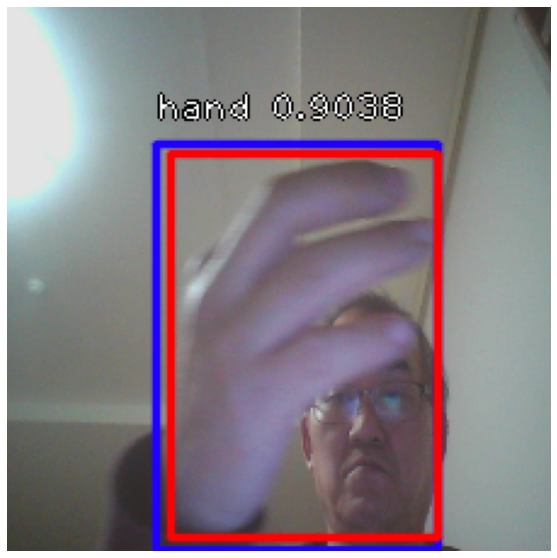

Actual : images/hand_086.png
Predicted : hand, Predicted Confidence : 90%


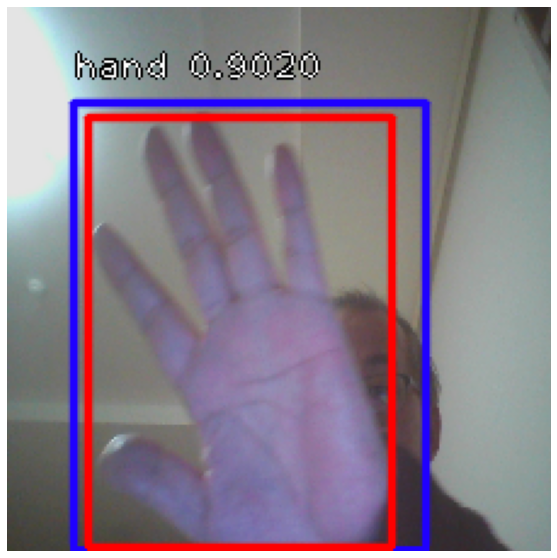

Actual : images/hand_002.png
Predicted : hand, Predicted Confidence : 82%


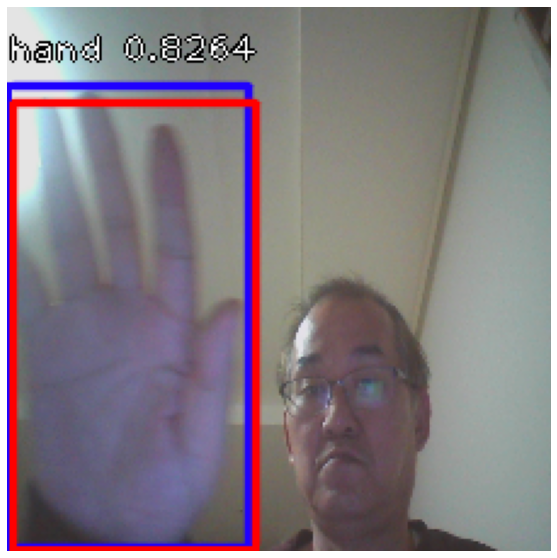

Actual : images/hand_064.png
Predicted : hand, Predicted Confidence : 97%


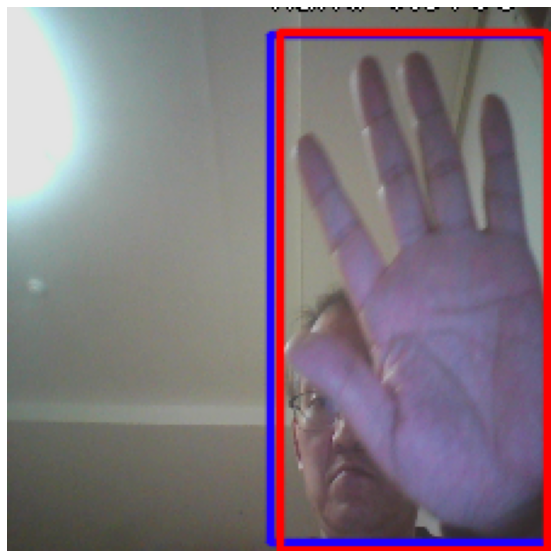

Actual : images/hand_045.png
Predicted : hand, Predicted Confidence : 97%


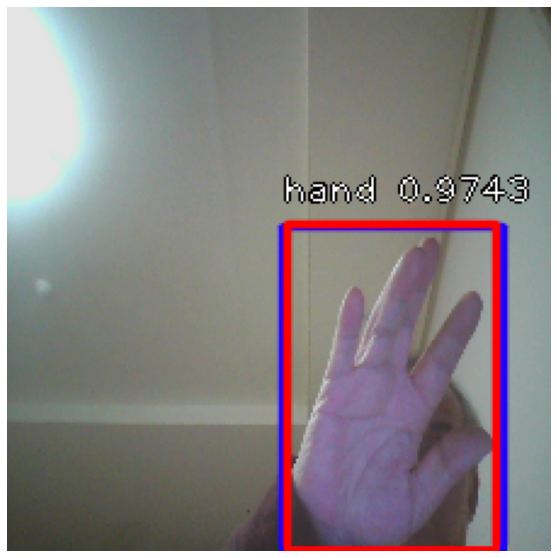

Accuracy on around 300 test images: 0.967741935483871


In [96]:
 label=show_image_with_predictions(test_df, threshold=0.5)